<a href="https://colab.research.google.com/github/KyungMinJin/Nerf_seminar/blob/main/Nerf_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Tensorflow library setup

In [1]:
#!pip install --upgrade python==3.7 cudatoolkit==10.0 tensorflow-gpu==1.15 numpy matplotlib imageio imageio-ffmpeg configargparse imagemagick
%tensorflow_version 1.15

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.15`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.


# Load lego image data

## Download dataset

In [2]:
!wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
!mkdir -p data
!cd data
!wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip
!unzip nerf_example_data.zip
!cd ..


--2021-11-02 12:47:58--  http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
Resolving cseweb.ucsd.edu (cseweb.ucsd.edu)... 132.239.8.30
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz [following]
--2021-11-02 12:47:59--  https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12727482 (12M)
Saving to: ‘tiny_nerf_data.npz’

tiny_nerf_data.npz  100%[===================>]  12.14M  21.2MB/s    in 0.6s    

2021-11-02 12:47:59 (21.2 MB/s) - ‘tiny_nerf_data.npz’ saved [12727482/12727482]

--2021-11-02 12:48:00--  http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip
Resolving cseweb.ucsd.edu (cseweb

In [3]:
import os
import tensorflow as tf
import numpy as np
import imageio 
import json
import sys

trans_t = lambda t : tf.convert_to_tensor([
    [1,0,0,0],
    [0,1,0,0],
    [0,0,1,t],
    [0,0,0,1],
], dtype=tf.float32)

rot_phi = lambda phi : tf.convert_to_tensor([
    [1,0,0,0],
    [0,tf.cos(phi),-tf.sin(phi),0],
    [0,tf.sin(phi), tf.cos(phi),0],
    [0,0,0,1],
], dtype=tf.float32)

rot_theta = lambda th : tf.convert_to_tensor([
    [tf.cos(th),0,-tf.sin(th),0],
    [0,1,0,0],
    [tf.sin(th),0, tf.cos(th),0],
    [0,0,0,1],
], dtype=tf.float32)


def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = rot_phi(phi/180.*np.pi) @ c2w
    c2w = rot_theta(theta/180.*np.pi) @ c2w
    c2w = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]]) @ c2w
    return c2w
    
def load_blender_data(basedir, half_res=False, testskip=1):
    splits = ['train', 'val', 'test']
    metas = {}
    for s in splits:
        with open(os.path.join(basedir, 'transforms_{}.json'.format(s)), 'r') as fp:
            metas[s] = json.load(fp)

    all_imgs = []
    all_poses = []
    counts = [0]
    for s in splits:
        meta = metas[s]
        imgs = []
        poses = []
        if s=='train' or testskip==0:
            skip = 1
        else:
            skip = testskip
            
        for frame in meta['frames'][::skip]:
            fname = os.path.join(basedir, frame['file_path'] + '.png')
            imgs.append(imageio.imread(fname))
            poses.append(np.array(frame['transform_matrix']))
        imgs = (np.array(imgs) / 255.).astype(np.float32) # keep all 4 channels (RGBA)
        poses = np.array(poses).astype(np.float32)
        counts.append(counts[-1] + imgs.shape[0])
        all_imgs.append(imgs)
        all_poses.append(poses)
    
    i_split = [np.arange(counts[i], counts[i+1]) for i in range(3)]
    
    imgs = np.concatenate(all_imgs, 0)
    poses = np.concatenate(all_poses, 0)
    
    H, W = imgs[0].shape[:2]
    camera_angle_x = float(meta['camera_angle_x'])
    focal = .5 * W / np.tan(.5 * camera_angle_x)
    
    render_poses = tf.stack([pose_spherical(angle, -30.0, 4.0) for angle in np.linspace(-180,180,40+1)[:-1]],0)
    
    if half_res:
        imgs = tf.image.resize_area(imgs, [400, 400]).numpy()
        H = H//2
        W = W//2
        focal = focal/2.
        
    return imgs, poses, render_poses, [H, W, focal], i_split


## Position Encoding

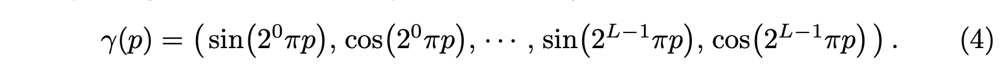

In [4]:
# Positional encoding

class Embedder:

    def __init__(self, **kwargs):

        self.kwargs = kwargs
        self.create_embedding_fn()

    def create_embedding_fn(self):

        embed_fns = []
        d = self.kwargs['input_dims']
        out_dim = 0
        if self.kwargs['include_input']:
            embed_fns.append(lambda x: x)
            out_dim += d

        max_freq = self.kwargs['max_freq_log2']
        N_freqs = self.kwargs['num_freqs']

        if self.kwargs['log_sampling']:
            freq_bands = 2.**tf.linspace(0., max_freq, N_freqs)
        else:
            freq_bands = tf.linspace(2.**0., 2.**max_freq, N_freqs)       # N_freqs = 10 = L

        for freq in freq_bands:
            for p_fn in self.kwargs['periodic_fns']:
                embed_fns.append(lambda x, p_fn=p_fn,
                                 freq=freq: p_fn(x * freq)) # sin cos 매핑
                out_dim += d

        self.embed_fns = embed_fns
        self.out_dim = out_dim

    def embed(self, inputs):
        return tf.concat([fn(inputs) for fn in self.embed_fns], -1)


def get_embedder(multires, i=0):

    if i == -1:
        return tf.identity, 3

    embed_kwargs = {
        'include_input': True,
        'input_dims': 3,
        'max_freq_log2': multires-1,
        'num_freqs': multires,
        'log_sampling': True,
        'periodic_fns': [tf.math.sin, tf.math.cos],
    }

    embedder_obj = Embedder(**embed_kwargs)
    def embed(x, eo=embedder_obj): return eo.embed(x)
    return embed, embedder_obj.out_dim

## Hierachical volume sampling

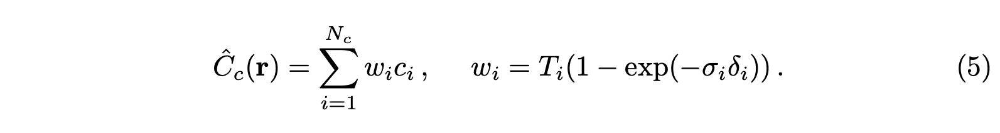



In [ ]:
# Hierarchical sampling helper

def sample_pdf(bins, weights, N_samples, det=False):

    # Get pdf
    weights += 1e-5  # prevent nans
    pdf = weights / tf.reduce_sum(weights, -1, keepdims=True)     # wi = wi/sigma wj
    cdf = tf.cumsum(pdf, -1)
    cdf = tf.concat([tf.zeros_like(cdf[..., :1]), cdf], -1)

    # Take uniform samples
    if det:
        u = tf.linspace(0., 1., N_samples)
        u = tf.broadcast_to(u, list(cdf.shape[:-1]) + [N_samples])
    else:
        u = tf.random.uniform(list(cdf.shape[:-1]) + [N_samples])

    # Hierarchical volume sample 하기 위해 Invert CDF 
    inds = tf.searchsorted(cdf, u, side='right') 
    below = tf.maximum(0, inds-1)
    above = tf.minimum(cdf.shape[-1]-1, inds)
    inds_g = tf.stack([below, above], -1)
    cdf_g = tf.gather(cdf, inds_g, axis=-1, batch_dims=len(inds_g.shape)-2)
    bins_g = tf.gather(bins, inds_g, axis=-1, batch_dims=len(inds_g.shape)-2)

    denom = (cdf_g[..., 1]-cdf_g[..., 0])
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u-cdf_g[..., 0])/denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1]-bins_g[..., 0])

    return samples

## Ray

**r(t) = o + td**

In [5]:
# Misc utils

def img2mse(x, y): return tf.reduce_mean(tf.square(x - y))

def mse2psnr(x): return -10.*tf.log(x)/tf.log(10.)

def to8b(x): return (255*np.clip(x, 0, 1)).astype(np.uint8)

# Ray helpers

def get_rays(H, W, focal, c2w):
    """Get ray origins, directions from a pinhole camera."""
    i, j = tf.meshgrid(tf.range(W, dtype=tf.float32),
                       tf.range(H, dtype=tf.float32), indexing='xy')
    dirs = tf.stack([(i-W*.5)/focal, -(j-H*.5)/focal, -tf.ones_like(i)], -1)
    rays_d = tf.reduce_sum(dirs[..., np.newaxis, :] * c2w[:3, :3], -1)
    rays_o = tf.broadcast_to(c2w[:3, -1], tf.shape(rays_d))
    return rays_o, rays_d

In [6]:
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

import random
import time
import matplotlib.pyplot as plt

tf.compat.v1.enable_eager_execution()


def batchify(fn, chunk):
    """Constructs a version of 'fn' that applies to smaller batches."""
    if chunk is None:
        return fn

    def ret(inputs):
        return tf.concat([fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], 0)
    return ret


def run_network(inputs, viewdirs, fn, embed_fn, embeddirs_fn, netchunk=1024*64):
    """Prepares inputs and applies network 'fn'."""

    inputs_flat = tf.reshape(inputs, [-1, inputs.shape[-1]])

    embedded = embed_fn(inputs_flat)
    if viewdirs is not None:
        input_dirs = tf.broadcast_to(viewdirs[:, None], inputs.shape)
        input_dirs_flat = tf.reshape(input_dirs, [-1, input_dirs.shape[-1]])
        embedded_dirs = embeddirs_fn(input_dirs_flat)
        embedded = tf.concat([embedded, embedded_dirs], -1)

    outputs_flat = batchify(fn, netchunk)(embedded)
    outputs = tf.reshape(outputs_flat, list(
        inputs.shape[:-1]) + [outputs_flat.shape[-1]])
    return outputs


def render_rays(ray_batch,
                network_fn,
                network_query_fn,
                N_samples,
                retraw=False,
                lindisp=False,
                perturb=0.,
                N_importance=0,
                network_fine=None,
                white_bkgd=False,
                raw_noise_std=0.,
                verbose=False):
    """Volumetric rendering.

    Args:
      ray_batch: array of shape [batch_size, ...]. All information necessary
        for sampling along a ray, including: ray origin, ray direction, min
        dist, max dist, and unit-magnitude viewing direction.
      network_fn: function. Model for predicting RGB and density at each point
        in space.
      network_query_fn: function used for passing queries to network_fn.
      N_samples: int. Number of different times to sample along each ray.
      retraw: bool. If True, include model's raw, unprocessed predictions.
      lindisp: bool. If True, sample linearly in inverse depth rather than in depth.
      perturb: float, 0 or 1. If non-zero, each ray is sampled at stratified
        random points in time.
      N_importance: int. Number of additional times to sample along each ray.
        These samples are only passed to network_fine.
      network_fine: "fine" network with same spec as network_fn.
      white_bkgd: bool. If True, assume a white background.
      raw_noise_std: ...
      verbose: bool. If True, print more debugging info.

    Returns:
      rgb_map: [num_rays, 3]. Estimated RGB color of a ray. Comes from fine model.
      disp_map: [num_rays]. Disparity map. 1 / depth.
      acc_map: [num_rays]. Accumulated opacity along each ray. Comes from fine model.
      raw: [num_rays, num_samples, 4]. Raw predictions from model.
      rgb0: See rgb_map. Output for coarse model.
      disp0: See disp_map. Output for coarse model.
      acc0: See acc_map. Output for coarse model.
      z_std: [num_rays]. Standard deviation of distances along ray for each
        sample.
    """

    def raw2outputs(raw, z_vals, rays_d):
        """Transforms model's predictions to semantically meaningful values.

        Args:
          raw: [num_rays, num_samples along ray, 4]. 모델 예측
          z_vals: [num_rays, num_samples along ray]. Integration time.
          rays_d: [num_rays, 3]. 각 ray 방향.

        Returns:
          rgb_map: [num_rays, 3]. Estimated RGB color of a ray.
          disp_map: [num_rays]. Disparity map. Inverse of depth map.
          acc_map: [num_rays]. Sum of weights along each ray.
          weights: [num_rays, num_samples]. Weights assigned to each sampled color.
          depth_map: [num_rays]. Estimated distance to object.
        """
        # Function for computing density from model prediction. This value is
        # strictly between [0, 1].
        def raw2alpha(raw, dists, act_fn=tf.nn.relu): return 1.0 - \
            tf.exp(-act_fn(raw) * dists)

        # Compute 'distance' (in time) between each integration time along a ray.
        dists = z_vals[..., 1:] - z_vals[..., :-1]

        # The 'distance' from the last integration time is infinity.
        dists = tf.concat(
            [dists, tf.broadcast_to([1e10], dists[..., :1].shape)],
            axis=-1)  # [N_rays, N_samples]

        # Multiply each distance by the norm of its corresponding direction ray
        # to convert to real world distance (accounts for non-unit directions).
        dists = dists * tf.linalg.norm(rays_d[..., None, :], axis=-1)

        # Extract RGB of each sample position along each ray.
        rgb = tf.math.sigmoid(raw[..., :3])  # [N_rays, N_samples, 3]

        # Add noise to model's predictions for density. Can be used to 
        # regularize network during training (prevents floater artifacts).
        noise = 0.
        if raw_noise_std > 0.:
            noise = tf.random.normal(raw[..., 3].shape) * raw_noise_std

        # Predict density of each sample along each ray. Higher values imply
        # higher likelihood of being absorbed at this point.
        alpha = raw2alpha(raw[..., 3] + noise, dists)  # [N_rays, N_samples]

        # Compute weight for RGB of each sample along each ray.  A cumprod() is
        # used to express the idea of the ray not having reflected up to this
        # sample yet.
        # [N_rays, N_samples]
        weights = alpha * \
            tf.math.cumprod(1.-alpha + 1e-10, axis=-1, exclusive=True)

        # Computed weighted color of each sample along each ray.
        rgb_map = tf.reduce_sum(
            weights[..., None] * rgb, axis=-2)  # [N_rays, 3]

        # Estimated depth map is expected distance.
        depth_map = tf.reduce_sum(weights * z_vals, axis=-1)

        # Disparity map is inverse depth.
        disp_map = 1./tf.maximum(1e-10, depth_map /
                                 tf.reduce_sum(weights, axis=-1))

        # Sum of weights along each ray. This value is in [0, 1] up to numerical error.
        acc_map = tf.reduce_sum(weights, -1)

        # To composite onto a white background, use the accumulated alpha map.
        if white_bkgd:
            rgb_map = rgb_map + (1.-acc_map[..., None])

        return rgb_map, disp_map, acc_map, weights, depth_map

    ###############################
    # batch size
    N_rays = ray_batch.shape[0]

    # Extract ray origin, direction.
    rays_o, rays_d = ray_batch[:, 0:3], ray_batch[:, 3:6]             # rays_o, rays_d 각각 [N_rays, 3]

    # Extract unit-normalized viewing direction.
    viewdirs = ray_batch[:, -3:] if ray_batch.shape[-1] > 8 else None

    # Extract lower, upper bound for ray distance.
    bounds = tf.reshape(ray_batch[..., 6:8], [-1, 1, 2])
    near, far = bounds[..., 0], bounds[..., 1]                        # [-1, 1]

    # Decide where to sample along each ray. Under the logic, all rays will be sampled at
    # the same times.
    t_vals = tf.linspace(0., 1., N_samples)
    if not lindisp:
        # Space integration times linearly between 'near' and 'far'. Same
        # integration points will be used for all rays.
        z_vals = near * (1.-t_vals) + far * (t_vals)
    else:
        # Sample linearly in inverse depth (disparity).
        z_vals = 1./(1./near * (1.-t_vals) + 1./far * (t_vals)) 
    z_vals = tf.broadcast_to(z_vals, [N_rays, N_samples])

    # Perturb sampling time along each ray.
    if perturb > 0.:
        # get intervals between samples
        mids = .5 * (z_vals[..., 1:] + z_vals[..., :-1])
        upper = tf.concat([mids, z_vals[..., -1:]], -1)
        lower = tf.concat([z_vals[..., :1], mids], -1)
        # stratified samples in those intervals
        t_rand = tf.random.uniform(z_vals.shape)
        z_vals = lower + (upper - lower) * t_rand

    # Points in space to evaluate model at.
    pts = rays_o[..., None, :] + rays_d[..., None, :] * \
        z_vals[..., :, None]  # [N_rays, N_samples, 3]

    # Evaluate model at each point.
    raw = network_query_fn(pts, viewdirs, network_fn)             # [N_rays, N_samples, 4]
    rgb_map, disp_map, acc_map, weights, depth_map = raw2outputs(
        raw, z_vals, rays_d)

    if N_importance > 0:
        rgb_map_0, disp_map_0, acc_map_0 = rgb_map, disp_map, acc_map

        # Obtain additional integration times to evaluate based on the weights
        # assigned to colors in the coarse model.
        z_vals_mid = .5 * (z_vals[..., 1:] + z_vals[..., :-1])
        z_samples = sample_pdf(
            z_vals_mid, weights[..., 1:-1], N_importance, det=(perturb == 0.))
        z_samples = tf.stop_gradient(z_samples)

        # Obtain all points to evaluate color, density at.
        z_vals = tf.sort(tf.concat([z_vals, z_samples], -1), -1)
        pts = rays_o[..., None, :] + rays_d[..., None, :] * \
            z_vals[..., :, None]  # [N_rays, N_samples + N_importance, 3]

        # Make predictions with network_fine.
        run_fn = network_fn if network_fine is None else network_fine
        raw = network_query_fn(pts, viewdirs, run_fn)
        rgb_map, disp_map, acc_map, weights, depth_map = raw2outputs(
            raw, z_vals, rays_d)

    ret = {'rgb_map': rgb_map, 'disp_map': disp_map, 'acc_map': acc_map}
    if retraw:
        ret['raw'] = raw
    if N_importance > 0:
        ret['rgb0'] = rgb_map_0
        ret['disp0'] = disp_map_0
        ret['acc0'] = acc_map_0
        ret['z_std'] = tf.math.reduce_std(z_samples, -1)  # [N_rays]

    for k in ret:
        tf.debugging.check_numerics(ret[k], 'output {}'.format(k))

    return ret


def batchify_rays(rays_flat, chunk=1024*32, **kwargs):
    """Render rays in smaller minibatches to avoid OOM."""
    all_ret = {}
    for i in range(0, rays_flat.shape[0], chunk):
        ret = render_rays(rays_flat[i:i+chunk], **kwargs)
        for k in ret:
            if k not in all_ret:
                all_ret[k] = []
            all_ret[k].append(ret[k])

    all_ret = {k: tf.concat(all_ret[k], 0) for k in all_ret}
    return all_ret


def render(H, W, focal,
           chunk=1024*32, rays=None, c2w=None, ndc=True,
           near=0., far=1.,
           use_viewdirs=False, c2w_staticcam=None,
           **kwargs):
    """Render rays

    Args:
      H: int. Height of image in pixels.
      W: int. Width of image in pixels.
      focal: float. Focal length of pinhole camera.
      chunk: int. Maximum number of rays to process simultaneously. Used to
        control maximum memory usage. Does not affect final results.
      rays: array of shape [2, batch_size, 3]. Ray origin and direction for
        each example in batch.
      c2w: array of shape [3, 4]. Camera-to-world transformation matrix.
      ndc: bool. If True, represent ray origin, direction in NDC coordinates.
      near: float or array of shape [batch_size]. Nearest distance for a ray.
      far: float or array of shape [batch_size]. Farthest distance for a ray.
      use_viewdirs: bool. If True, use viewing direction of a point in space in model.
      c2w_staticcam: array of shape [3, 4]. If not None, use this transformation matrix for 
       camera while using other c2w argument for viewing directions.

    Returns:
      rgb_map: [batch_size, 3]. Predicted RGB values for rays.
      disp_map: [batch_size]. Disparity map. Inverse of depth.
      acc_map: [batch_size]. Accumulated opacity (alpha) along a ray.
      extras: dict with everything returned by render_rays().
    """

    if c2w is not None:
        # special case to render full image
        rays_o, rays_d = get_rays(H, W, focal, c2w)
    else:
        # use provided ray batch
        rays_o, rays_d = rays

    if use_viewdirs:
        # provide ray directions as input
        viewdirs = rays_d
        if c2w_staticcam is not None:
            # special case to visualize effect of viewdirs
            rays_o, rays_d = get_rays(H, W, focal, c2w_staticcam)

        # Make all directions unit magnitude.
        # shape: [batch_size, 3]
        viewdirs = viewdirs / tf.linalg.norm(viewdirs, axis=-1, keepdims=True)
        viewdirs = tf.cast(tf.reshape(viewdirs, [-1, 3]), dtype=tf.float32)

    sh = rays_d.shape                                                         # [..., 3] 

    # Create ray batch
    rays_o = tf.cast(tf.reshape(rays_o, [-1, 3]), dtype=tf.float32)
    rays_d = tf.cast(tf.reshape(rays_d, [-1, 3]), dtype=tf.float32)
    near, far = near * \
        tf.ones_like(rays_d[..., :1]), far * tf.ones_like(rays_d[..., :1])

    # (ray origin, ray direction, min dist, max dist) for each ray
    rays = tf.concat([rays_o, rays_d, near, far], axis=-1)
    if use_viewdirs:
        # (ray origin, ray direction, min dist, max dist, normalized viewing direction)
        rays = tf.concat([rays, viewdirs], axis=-1)

    # Render and reshape
    all_ret = batchify_rays(rays, chunk, **kwargs)
    for k in all_ret:
        k_sh = list(sh[:-1]) + list(all_ret[k].shape[1:])
        all_ret[k] = tf.reshape(all_ret[k], k_sh)

    k_extract = ['rgb_map', 'disp_map', 'acc_map']
    ret_list = [all_ret[k] for k in k_extract]
    ret_dict = {k: all_ret[k] for k in all_ret if k not in k_extract}
    return ret_list + [ret_dict]


def render_path(render_poses, hwf, chunk, render_kwargs, gt_imgs=None, savedir=None, render_factor=0):

    H, W, focal = hwf

    if render_factor != 0:
        # Render downsampled for speed
        H = H//render_factor
        W = W//render_factor
        focal = focal/render_factor

    rgbs = []
    disps = []

    t = time.time()
    for i, c2w in enumerate(render_poses):
        print(i, len(render_poses), time.time() - t)
        t = time.time()
        rgb, disp, acc, _ = render(
            H, W, focal, chunk=chunk, c2w=c2w[:3, :4], **render_kwargs)
        rgbs.append(rgb.numpy())
        disps.append(disp.numpy())
        if i == 0:
            print(rgb.shape, disp.shape)

        if gt_imgs is not None and render_factor == 0:
            p = -10. * np.log10(np.mean(np.square(rgb - gt_imgs[i])))
            print(p)

        if savedir is not None:
            rgb8 = to8b(rgbs[-1])
            filename = os.path.join(savedir, '{:03d}.png'.format(i))
            imageio.imwrite(filename, rgb8)

    rgbs = np.stack(rgbs, 0)
    disps = np.stack(disps, 0)

    return rgbs, disps

# Arguments

In [7]:
class Args:
  def __init__(self):
    self.lrate = 5e-4
    self.lrate_decay = 250
    self.datadir = './nerf_synthetic/lego'
    self.factor= 8
    self.expname = 'lego_test'
    self.basedir = './logs'
    self.dataset_type = 'blender'
    self.perturb = 1
    self.half_res = True
    self.no_batching = True
    # coarse
    self.netdepth = 8               # layer 수
    self.netwidth = 256             # channel 수
    self.N_samples = 64             # sample 수
    # fine
    self.netdepth_fine = 8
    self.netwidth_fine = 256        
    self.N_importance = 64

    self.i_embed = 0
    self.use_viewdirs = True
    self.multires = 10              # L = 10 for r(x)
    self.multires_views = 4         # L = 4  for r(d)
    self.white_bkgd = True
    self.N_rand = 1024
    self.testskip = 8
    self.raw_noise_std = 0.
    self.ft_path = None
    self.precrop_iters = 0
    self.chunk = 1024*32
    self.netchunk = 1024*64
    self.i_weights = 10000


    self.i_print = 25
    self.i_img = 25
    self.i_testset = 50000
    self.i_video = 25
    self.no_reload = False

# Nerf architecture
8 layers + layer (256ch, output volume density, input viewing direction) + layer (128 ch)

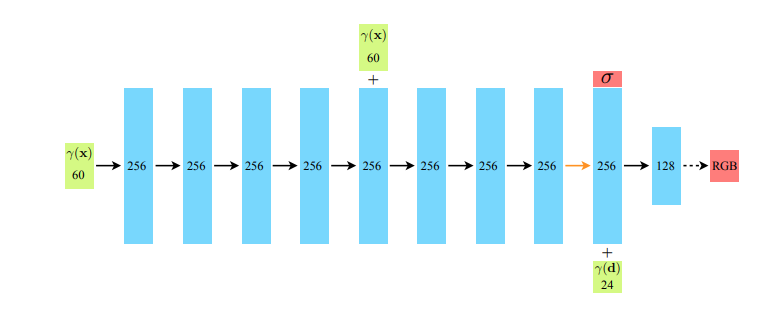

z_vals = 

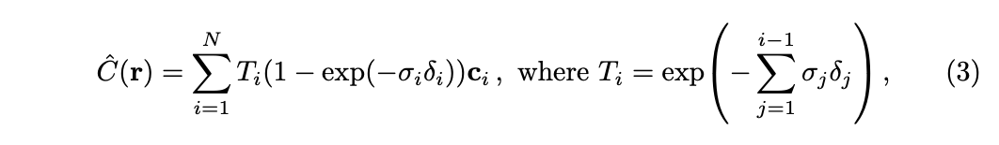

In [8]:
# Model architecture

def init_nerf_model(D=8, W=256, input_ch=3, input_ch_views=3, output_ch=4, skips=[4], use_viewdirs=False):

    relu = tf.keras.layers.ReLU()
    def dense(W, act=relu): return tf.keras.layers.Dense(W, activation=act)

    print('MODEL', input_ch, input_ch_views, type(
        input_ch), type(input_ch_views), use_viewdirs)
    input_ch = int(input_ch)
    input_ch_views = int(input_ch_views)

    inputs = tf.keras.Input(shape=(input_ch + input_ch_views))
    inputs_pts, inputs_views = tf.split(inputs, [input_ch, input_ch_views], -1)
    inputs_pts.set_shape([None, input_ch])
    inputs_views.set_shape([None, input_ch_views])

    print(inputs.shape, inputs_pts.shape, inputs_views.shape)
    outputs = inputs_pts
    for i in range(D):                                              # 8 layer 동안
        outputs = dense(W)(outputs)                                 # dense layer 통과
        if i in skips:                                              # [4](즉 5번 layer일 때 input concat)
            outputs = tf.concat([inputs_pts, outputs], -1)

    if use_viewdirs:                                                  
        alpha_out = dense(1, act=None)(outputs)                     # non Lambertian 효과 때문에 out density 계산 후 
        bottleneck = dense(256, act=None)(outputs)
        inputs_viewdirs = tf.concat(
            [bottleneck, inputs_views], -1)                         # concat view dirs
        outputs = inputs_viewdirs

        for i in range(1):
            outputs = dense(W//2)(outputs)                          # 마지막 layer 128 channel
        outputs = dense(3, act=None)(outputs)                       # rgb out
        outputs = tf.concat([outputs, alpha_out], -1)               # rgb, density
    else:
        outputs = dense(output_ch, act=None)(outputs)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

def create_nerf(args):
    """Instantiate NeRF's MLP model."""

    embed_fn, input_ch = get_embedder(args.multires, args.i_embed)

    input_ch_views = 0
    embeddirs_fn = None
    if args.use_viewdirs:
        embeddirs_fn, input_ch_views = get_embedder(
            args.multires_views, args.i_embed)
    output_ch = 4
    skips = [4]                                                               
    model = init_nerf_model(                                                  # coarse network
        D=args.netdepth, W=args.netwidth,                                     # 8 layers 256 ch
        input_ch=input_ch, output_ch=output_ch, skips=skips,                  # 5번 layer 에 skip connection (input x y z)
        input_ch_views=input_ch_views, use_viewdirs=args.use_viewdirs)
    grad_vars = model.trainable_variables
    models = {'model': model}

    model_fine = None
    if args.N_importance > 0:                                                 # fine network 사용
        model_fine = init_nerf_model(
            D=args.netdepth_fine, W=args.netwidth_fine,                       # 8 layer 256 ch
            input_ch=input_ch, output_ch=output_ch, skips=skips,
            input_ch_views=input_ch_views, use_viewdirs=args.use_viewdirs)
        grad_vars += model_fine.trainable_variables
        models['model_fine'] = model_fine

    #fine network query
    def network_query_fn(inputs, viewdirs, network_fn): return run_network(
        inputs, viewdirs, network_fn,
        embed_fn=embed_fn,
        embeddirs_fn=embeddirs_fn,
        netchunk=args.netchunk)

    render_kwargs_train = {
        'network_query_fn': network_query_fn,
        'perturb': args.perturb,
        'N_importance': args.N_importance,
        'network_fine': model_fine,
        'N_samples': args.N_samples,
        'network_fn': model,
        'use_viewdirs': args.use_viewdirs,
        'white_bkgd': args.white_bkgd,
        'raw_noise_std': args.raw_noise_std,
    }

    # NDC only good for LLFF-style forward facing data
    if args.dataset_type != 'llff' or args.no_ndc:
        print('Not ndc!')
        render_kwargs_train['ndc'] = False
        render_kwargs_train['lindisp'] = False

    render_kwargs_test = {
        k: render_kwargs_train[k] for k in render_kwargs_train}
    render_kwargs_test['perturb'] = False
    render_kwargs_test['raw_noise_std'] = 0.

    start = 0
    basedir = args.basedir
    expname = args.expname

    if args.ft_path is not None and args.ft_path != 'None':
        ckpts = [args.ft_path]
    else:
        ckpts = [os.path.join(basedir, expname, f) for f in sorted(os.listdir(os.path.join(basedir, expname))) if
                 ('model_' in f and 'fine' not in f and 'optimizer' not in f)]
    print('Found ckpts', ckpts)
    if len(ckpts) > 0 and not args.no_reload:
        ft_weights = ckpts[-1]
        print('Reloading from', ft_weights)
        model.set_weights(np.load(ft_weights, allow_pickle=True))
        start = int(ft_weights[-10:-4]) + 1
        print('Resetting step to', start)

        if model_fine is not None:
            ft_weights_fine = '{}_fine_{}'.format(
                ft_weights[:-11], ft_weights[-10:])
            print('Reloading fine from', ft_weights_fine)
            model_fine.set_weights(np.load(ft_weights_fine, allow_pickle=True))

    return render_kwargs_train, render_kwargs_test, start, grad_vars, models

# Train

## Loss function

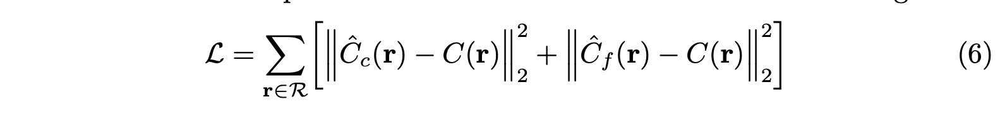

Fixing random seed 1
Loaded blender (138, 400, 400, 4) (40, 4, 4) [400, 400, 555.5555155968841] ./nerf_synthetic/lego
MODEL 63 27 <class 'int'> <class 'int'> True
(?, 90) (?, 63) (?, 27)
MODEL 63 27 <class 'int'> <class 'int'> True
(?, 90) (?, 63) (?, 27)
Not ndc!
Found ckpts ['./logs/lego_test/model_000000.npy']
Reloading from ./logs/lego_test/model_000000.npy
Resetting step to 1
Reloading fine from ./logs/lego_test/model_fine_000000.npy
Begin
TRAIN views are [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98 99]
TEST views are [113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130
 131 132 133 134 135 136 137]
VAL views are [100 101 102 103 104 105 106 107 108 109 110 111 112]


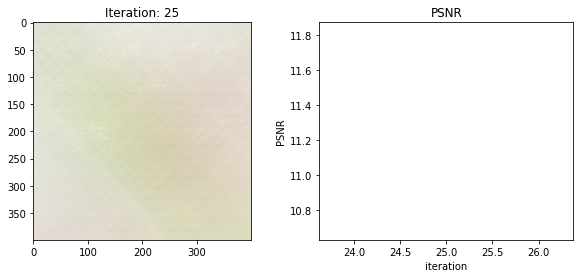

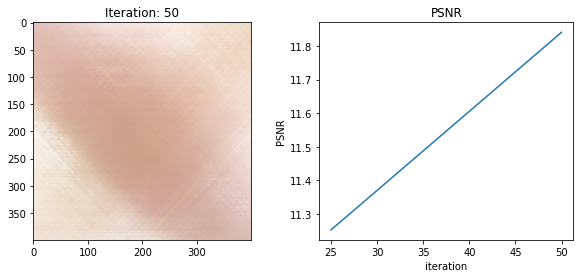

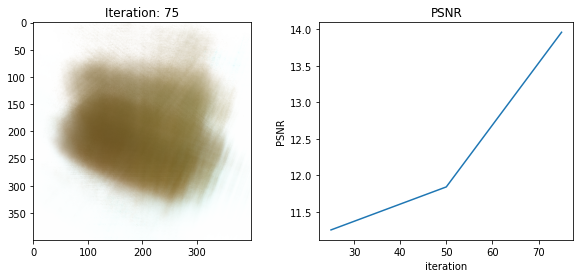

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


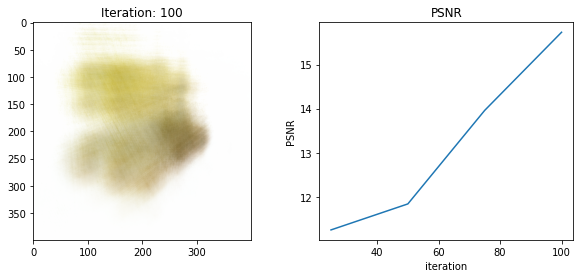

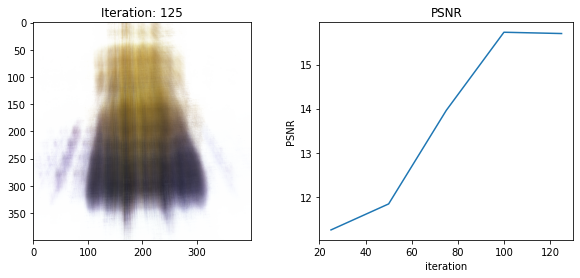

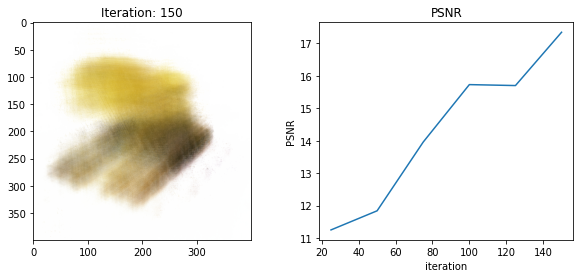

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


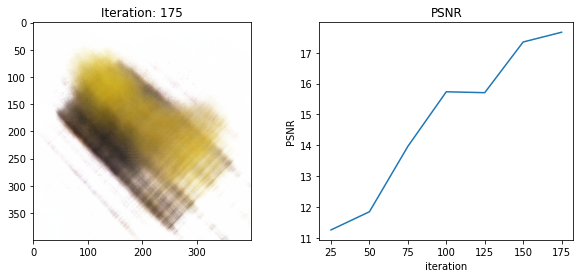

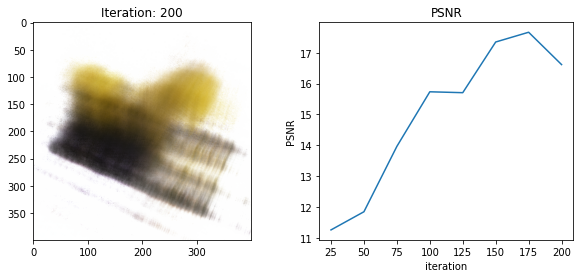

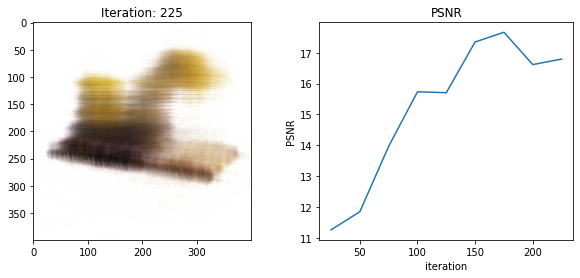

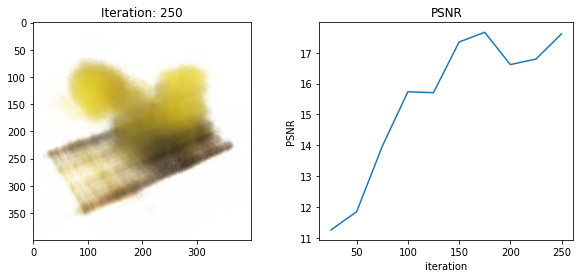

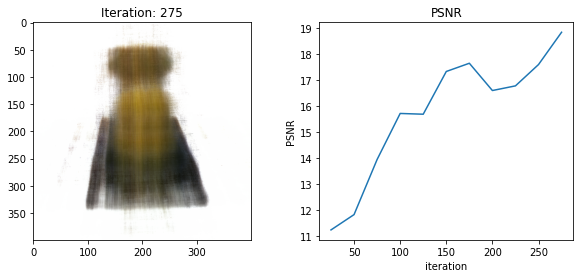

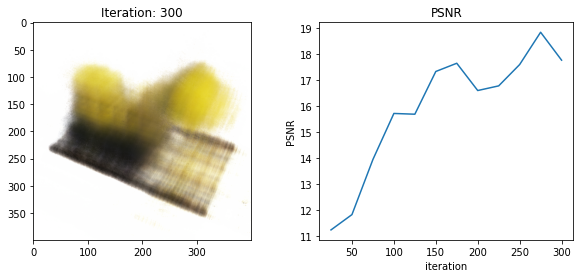

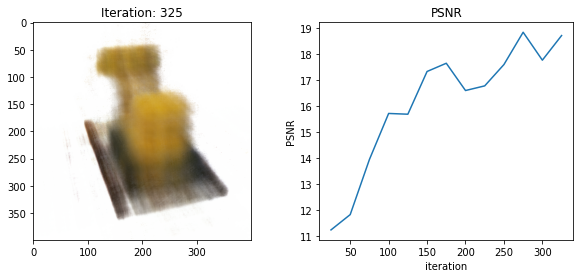

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


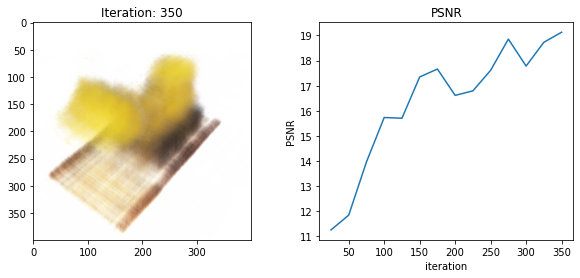

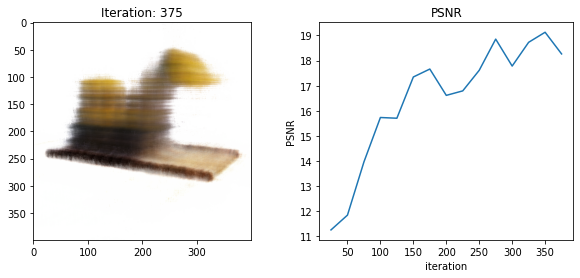

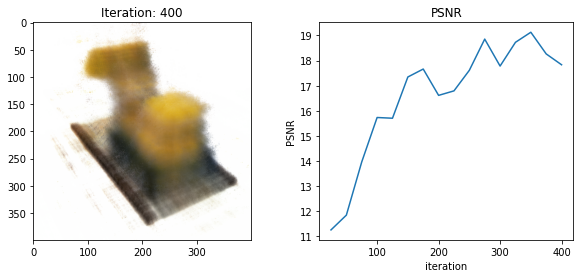

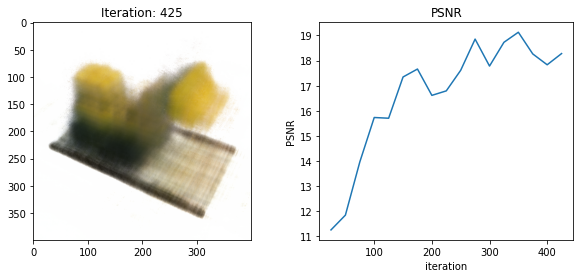

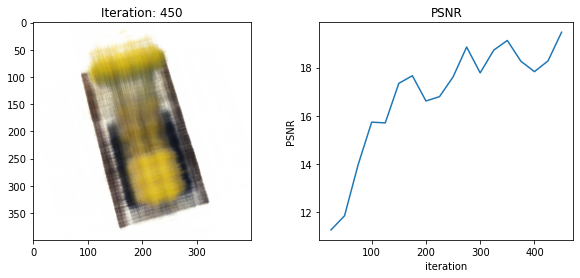

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


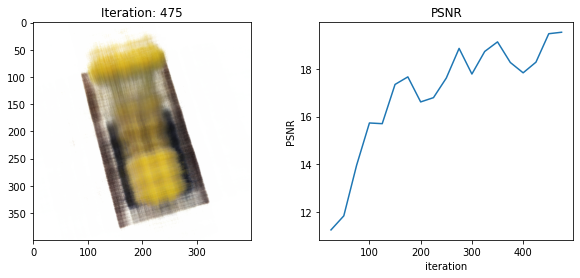

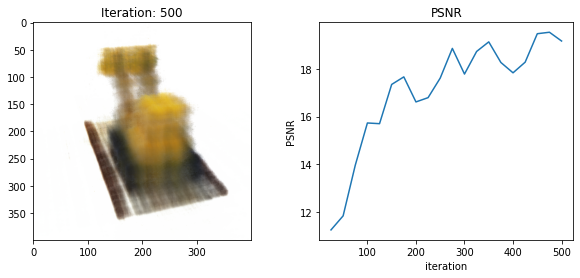

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


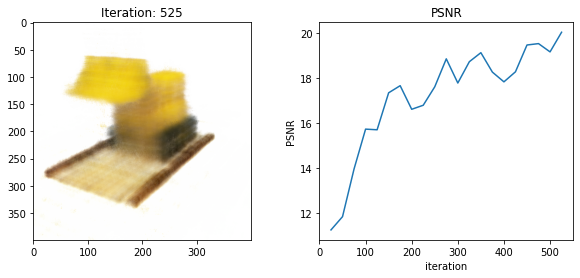

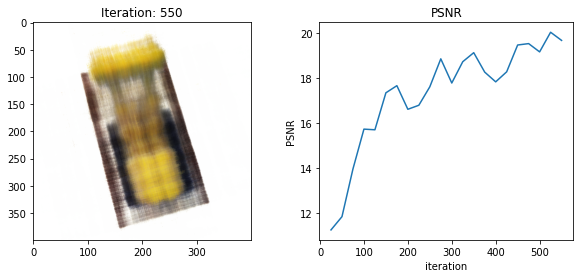

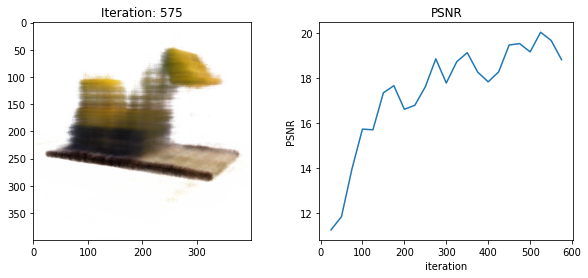

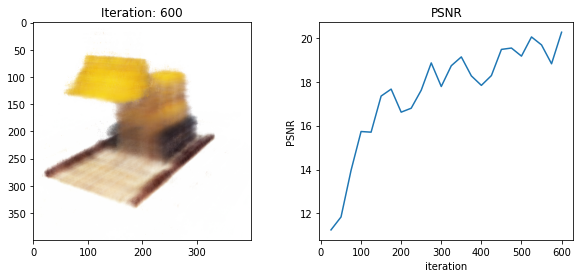

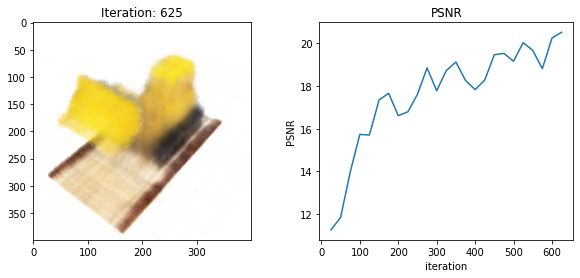

...

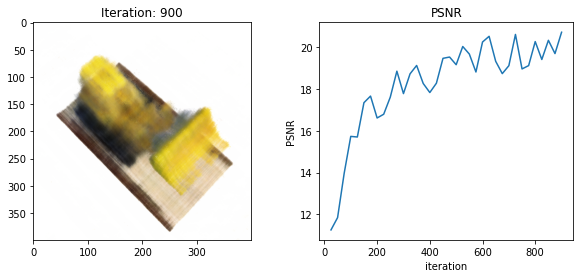

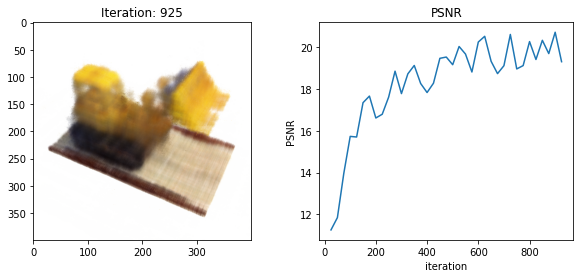

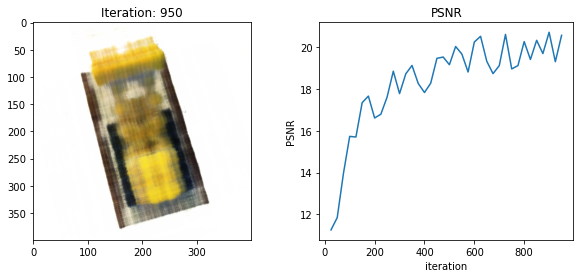

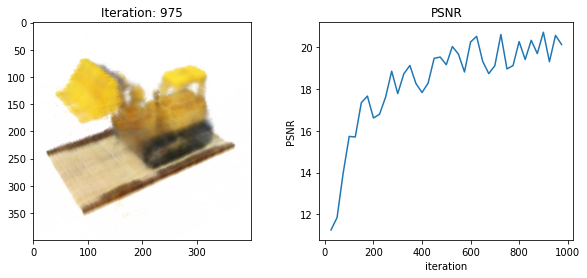

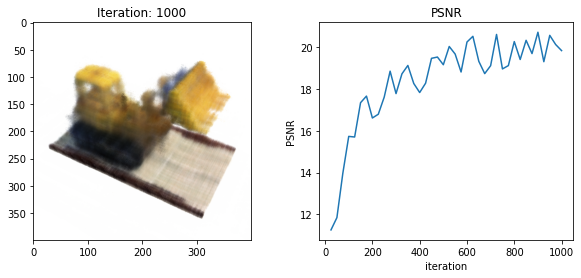

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


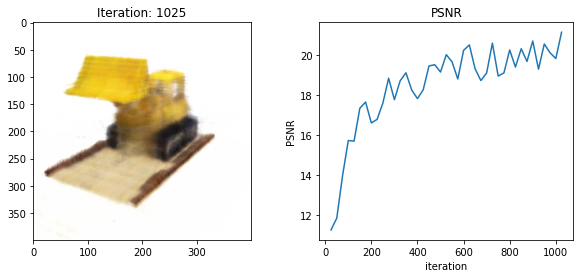

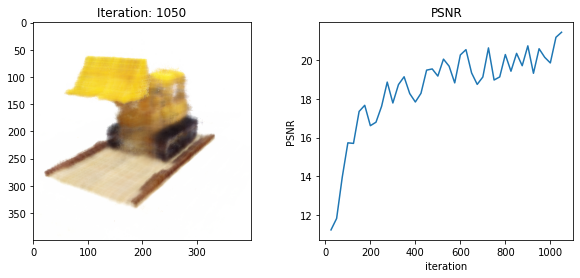

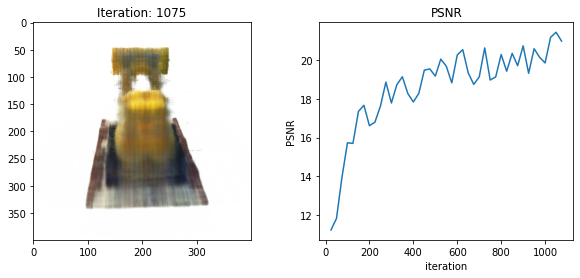

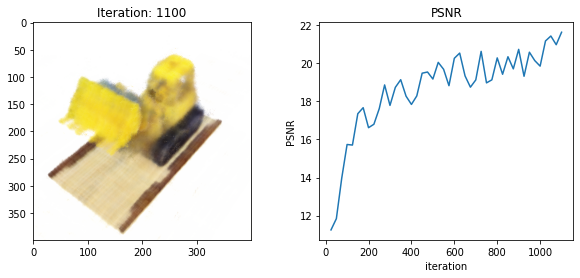

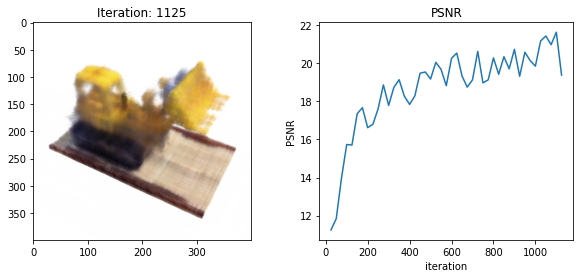

...

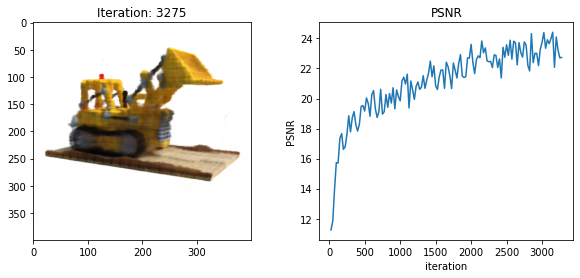

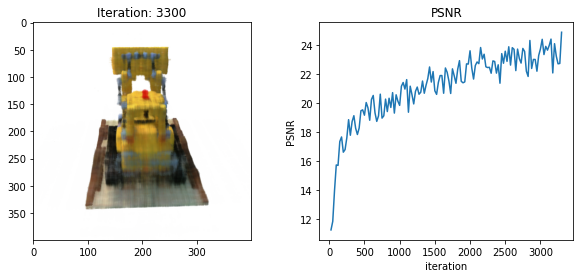

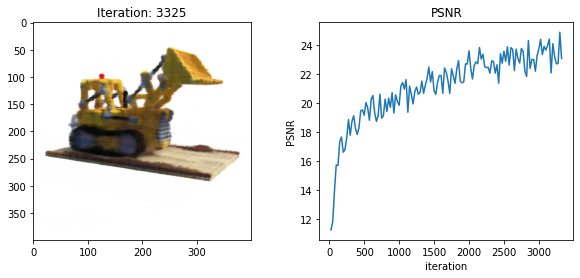

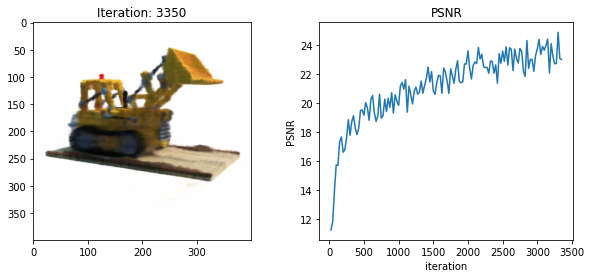

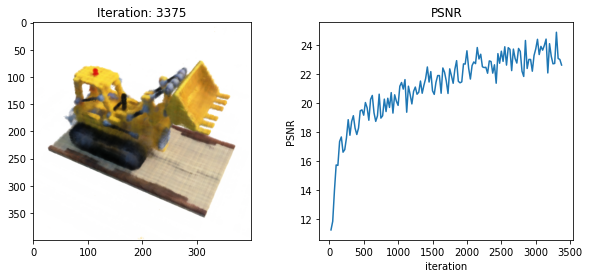

In [ ]:
iternums = []
psnrs = []
i_plot = 25

def train():
    print('Fixing random seed', 1)
    np.random.seed(1)
    tf.compat.v1.set_random_seed(1)
    args = Args()
    # Load data
    images, poses, render_poses, hwf, i_split = load_blender_data(
        args.datadir, args.half_res, args.testskip)
    print('Loaded blender', images.shape,
          render_poses.shape, hwf, args.datadir)
    i_train, i_val, i_test = i_split

    near = 2.
    far = 6.

    if args.white_bkgd:
        images = images[..., :3]*images[..., -1:] + (1.-images[..., -1:])
    else:
        images = images[..., :3]

    # Cast intrinsics to right types
    H, W, focal = hwf
    H, W = int(H), int(W)
    hwf = [H, W, focal]

    # Create log dir and copy the config file
    basedir = args.basedir
    expname = args.expname
    os.makedirs(os.path.join(basedir, expname), exist_ok=True)
    f = os.path.join(basedir, expname, 'args.txt')
    with open(f, 'w') as file:
        for arg in sorted(vars(args)):
            attr = getattr(args, arg)
            file.write('{} = {}\n'.format(arg, attr))

    # Create nerf model
    render_kwargs_train, render_kwargs_test, start, grad_vars, models = create_nerf(
        args)

    bds_dict = {
        'near': tf.cast(near, tf.float32),
        'far': tf.cast(far, tf.float32),
    }
    render_kwargs_train.update(bds_dict)
    render_kwargs_test.update(bds_dict)

    # Create optimizer
    lrate = args.lrate
    if args.lrate_decay > 0:
        lrate = tf.keras.optimizers.schedules.ExponentialDecay(lrate,
                                                               decay_steps=args.lrate_decay * 1000, decay_rate=0.1)
    optimizer = tf.keras.optimizers.Adam(lrate)
    models['optimizer'] = optimizer

    global_step = tf.compat.v1.train.get_or_create_global_step()
    global_step.assign(start)

    # Prepare raybatch tensor if batching random rays
    N_rand = args.N_rand

    N_iters = 10000
    print('Begin')
    print('TRAIN views are', i_train)
    print('TEST views are', i_test)
    print('VAL views are', i_val)

    for i in range(start, N_iters):
        time0 = time.time()

        img_i = np.random.choice(i_train)                       # 이미지 한개에서 랜덤하게 ray batch 샘플링
        target = images[img_i]
        pose = poses[img_i, :3, :4]

        rays_o, rays_d = get_rays(H, W, focal, pose)
        if i < args.precrop_iters:
            dH = int(H//2 * args.precrop_frac)
            dW = int(W//2 * args.precrop_frac)
            coords = tf.stack(tf.meshgrid(
                tf.range(H//2 - dH, H//2 + dH), 
                tf.range(W//2 - dW, W//2 + dW), 
                indexing='ij'), -1)
            if i < 10:
                print('precrop', dH, dW, coords[0,0], coords[-1,-1])
        else:
            coords = tf.stack(tf.meshgrid(
                tf.range(H), tf.range(W), indexing='ij'), -1)
        coords = tf.reshape(coords, [-1, 2])
        select_inds = np.random.choice(
            coords.shape[0], size=[N_rand], replace=False)
        select_inds = tf.gather_nd(coords, select_inds[:, tf.newaxis])
        rays_o = tf.gather_nd(rays_o, select_inds)
        rays_d = tf.gather_nd(rays_d, select_inds)
        batch_rays = tf.stack([rays_o, rays_d], 0)
        target_s = tf.gather_nd(target, select_inds)

        #####  Core optimization loop  #####

        with tf.GradientTape() as tape:

            # Make predictions for color, disparity, accumulated opacity.
            rgb, disp, acc, extras = render(
                H, W, focal, chunk=args.chunk, rays=batch_rays,
                verbose=i < 10, retraw=True, **render_kwargs_train)

            # Compute MSE loss between predicted and true RGB.
            img_loss = img2mse(rgb, target_s)                           # fine network loss 추가
            trans = extras['raw'][..., -1]
            loss = img_loss
            psnr = mse2psnr(img_loss)

            # Add MSE loss for coarse-grained model
            if 'rgb0' in extras:
                img_loss0 = img2mse(extras['rgb0'], target_s)           # coarse network loss 추가
                loss += img_loss0
                psnr0 = mse2psnr(img_loss0)

        gradients = tape.gradient(loss, grad_vars)
        optimizer.apply_gradients(zip(gradients, grad_vars))

        dt = time.time()-time0

        #####           end            #####

        # Rest is logging

        def save_weights(net, prefix, i):
            path = os.path.join(
                basedir, expname, '{}_{:06d}.npy'.format(prefix, i))
            np.save(path, net.get_weights())
            print('saved weights at', path)

        if i % args.i_weights == 0:
            for k in models:
                save_weights(models[k], k, i)

        if i == N_iters - 1:
            rgbs, disps = render_path(
                render_poses, hwf, args.chunk, render_kwargs_test)
            print('Done, saving', rgbs.shape, disps.shape)
            moviebase = os.path.join(
                basedir, expname, '{}_spiral_{:06d}_'.format(expname, i))
            imageio.mimwrite(moviebase + 'rgb.mp4',
                             to8b(rgbs), fps=30, quality=8)
            imageio.mimwrite(moviebase + 'disp.mp4',
                             to8b(disps / np.max(disps)), fps=30, quality=8)

        if i % args.i_testset == 0 and i > 0:
            testsavedir = os.path.join(
                basedir, expname, 'testset_{:06d}'.format(i))
            os.makedirs(testsavedir, exist_ok=True)
            print('test poses shape', poses[i_test].shape)
            render_path(poses[i_test], hwf, args.chunk, render_kwargs_test,
                        gt_imgs=images[i_test], savedir=testsavedir)
            print('Saved test set')

        if i % args.i_print == 0 or i < 10:

            if i % args.i_img == 0:
                img_i = np.random.choice(i_val)
                target = images[img_i]
                pose = poses[img_i, :3, :4]

                rgb, disp, acc, extras = render(H, W, focal, chunk=args.chunk, c2w=pose,
                                                **render_kwargs_test)

                psnr = mse2psnr(img2mse(rgb, target))
                psnrs.append(psnr.numpy())
                iternums.append(i)
                tf.contrib.summary.scalar('psnr_holdout', psnr)
                tf.contrib.summary.image('rgb_holdout', target[tf.newaxis])
                plt.figure(figsize=(10,4))
                plt.subplot(121)
                plt.imshow(rgb)
                plt.title(f'Iteration: {i}')
                plt.subplot(122)
                plt.plot(iternums, psnrs)
                plt.title('PSNR')
                plt.ylabel('PSNR')
                plt.xlabel('iteration')
                plt.show()

        global_step.assign_add(1)

train()


# Video Result

In [12]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('./logs/lego_test/lego_test_spiral_009999_rgb.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls autoplay loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)